# Train a model

In this part, we will train a model for cell annotation. For that we will select 10 random tiles and a random z plane is that image (so a total of 10 2d images).
We will use the pretrained tissuenet model and then manualy annotate these samples.

In a second step, we will use the annotated images to create a new and better model, that will be used for the entire dataset.

In [1]:
!nvidia-smi

Tue Jun 14 13:13:59 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  On   | 00000000:3D:00.0 Off |                  N/A |
|  0%   38C    P8    25W / 250W |      1MiB / 11019MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 208...  On   | 00000000:3E:00.0 Off |                  N/A |
|  0%   

## Load the libraries

And enable logging for cellpose

In [2]:
import os, shutil
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.dpi'] = 150
from cellpose import core, utils, io, models, metrics
import skimage.io
import tifffile
from cellpose import plot
import random
import re

use_GPU = core.use_gpu()
yn = ['NO', 'YES']
print(f'>>> GPU activated? {yn[use_GPU]}')

>>> GPU activated? YES


In [3]:
# call logger_setup to have output of cellpose written
from cellpose.io import logger_setup
logger_setup();

2022-06-14 13:14:31,832 [INFO] WRITING LOG OUTPUT TO /home/mheeg/.cellpose/run.log


## Select training images

Select (pseudo) random images

In [4]:
random.seed(2022)
img_x = random.choices(range(1, 11), k=10)
img_y = random.choices(range(1, 11), k=10)
img_z = random.choices(range(0, 7), k=10)
img_x, img_y, img_z

([6, 5, 4, 1, 8, 10, 5, 7, 9, 9],
 [8, 4, 7, 6, 6, 1, 8, 3, 10, 9],
 [2, 2, 0, 2, 3, 0, 1, 3, 0, 0])

In [5]:
# copy the images
for x,y,z, i in zip(img_x, img_y, img_z, range(0,10)):
    print(f"image {i}: {x} {y} {z}")
    img = skimage.io.imread(f"scratch/tiles/tile_{x}_{y}.tif")[z]
    # Add R channel with zeros. Ctyoplasm = green, nucleus = blue
    img = np.concatenate(
        (
            np.zeros((1, img.shape[1], img.shape[2]),
                    dtype=np.int8),
            img
        ), 
        axis = 0
    )
    # save
    with tifffile.TiffWriter(f"training/tissuenet/img_{i}.tif") as tif:
        tif.save(img)

image 0: 6 8 2
image 1: 5 4 2
image 2: 4 7 0
image 3: 1 6 2
image 4: 8 6 3
image 5: 10 1 0
image 6: 5 8 1
image 7: 7 3 3
image 8: 9 10 0
image 9: 9 9 0


## Use `tissuenet` model

we use the tissuenet model to create a segmentaion for these files. this need to be manually checked and the new segmentation masks will be used to train a new model

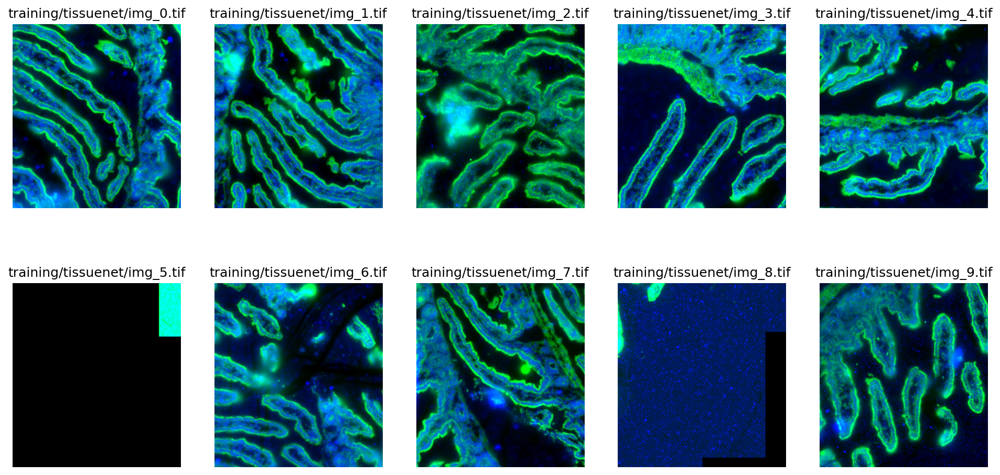

In [6]:
import glob
files = glob.glob("training/tissuenet/*.tif")
files.sort()    
    
# need to rearrange the dimension, 
# imread automatically puts RGB in dimension 2, move it back to 0
imgs = [np.transpose(skimage.io.imread(f), [2,0,1]) for f in files]
nimg = len(imgs)

plt.figure(figsize=(16,8))
for k,img in enumerate(imgs):
    plt.subplot(2,5,k+1)
    plt.title(files[k])
    plt.axis('off')
    plt.imshow(plot.image_to_rgb(img[1:3,:,:], channels=[2,3]))

In [7]:
model = models.CellposeModel(gpu=use_GPU, model_type='tissuenet')

2022-06-14 13:14:45,399 [INFO] >> tissuenet << model set to be used
2022-06-14 13:14:45,403 [INFO] ** TORCH CUDA version installed and working. **
2022-06-14 13:14:45,404 [INFO] >>>> using GPU
2022-06-14 13:14:45,925 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


In [8]:
masks, flows, styles = model.eval(imgs, channels=[2,3], diameter=30, do_3D=False)

2022-06-14 13:15:16,644 [INFO] 100%|##########| 10/10 [00:30<00:00,  3.07s/it]


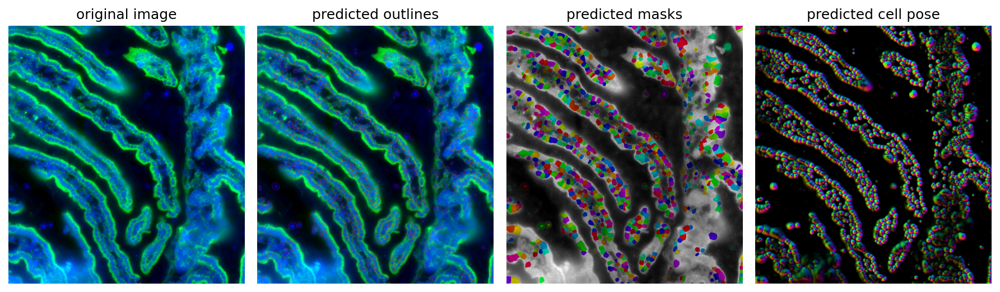

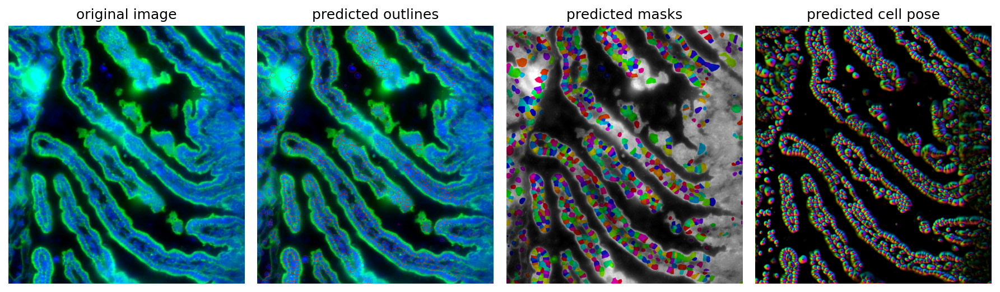

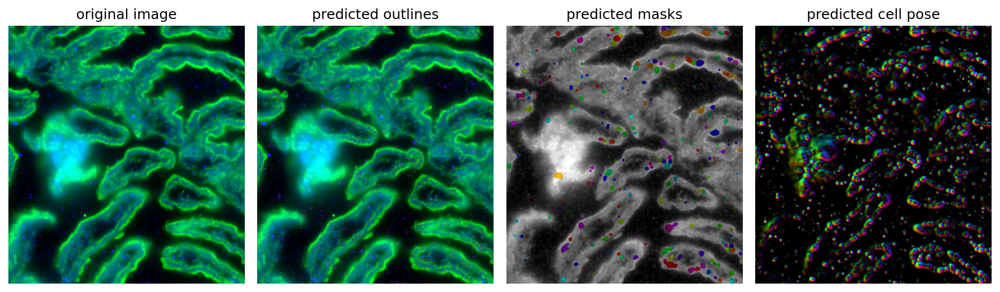

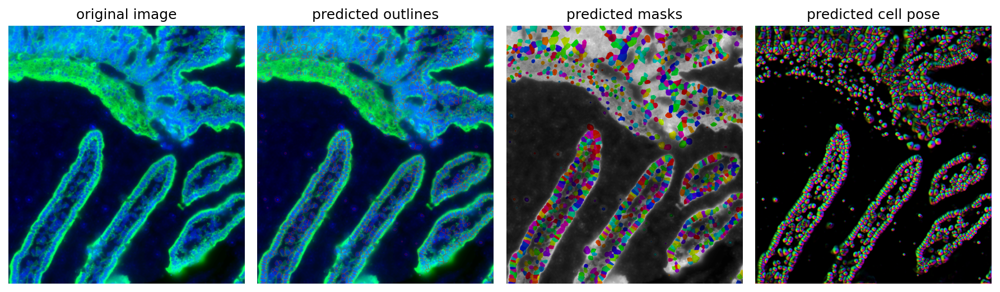

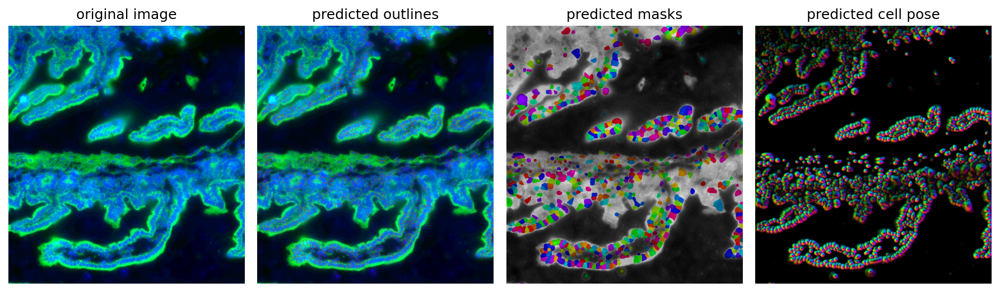

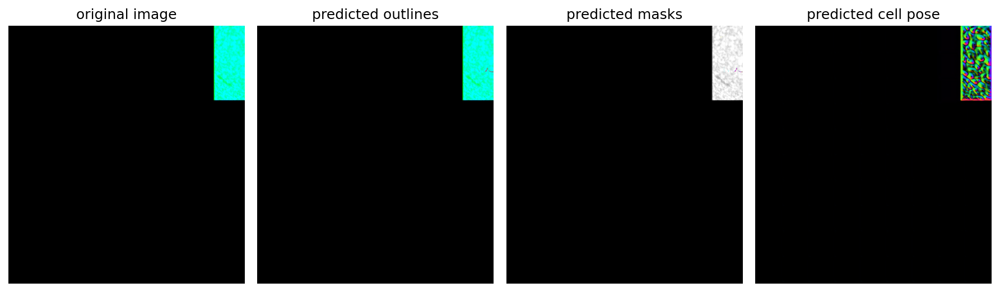

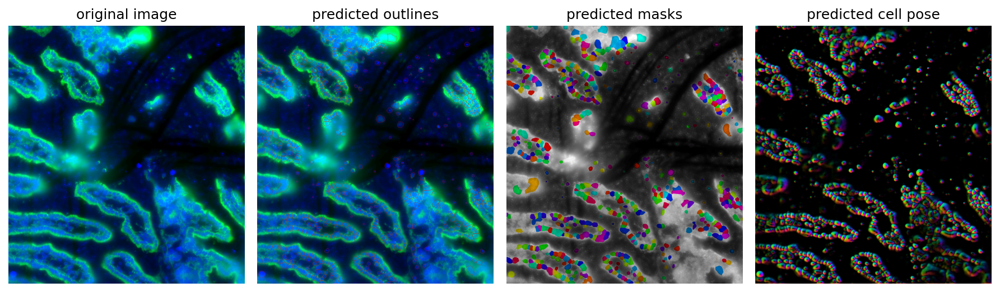

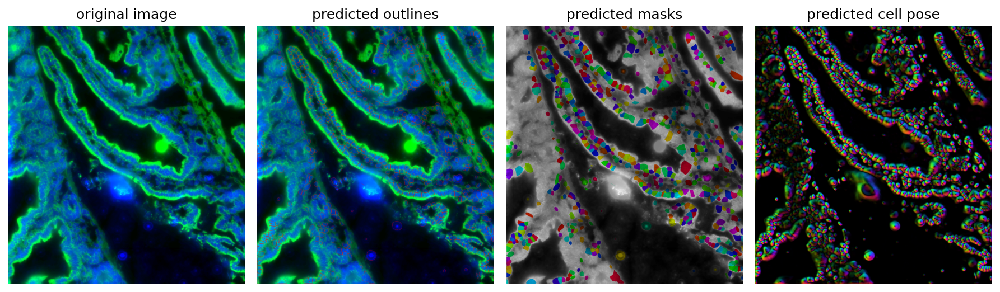

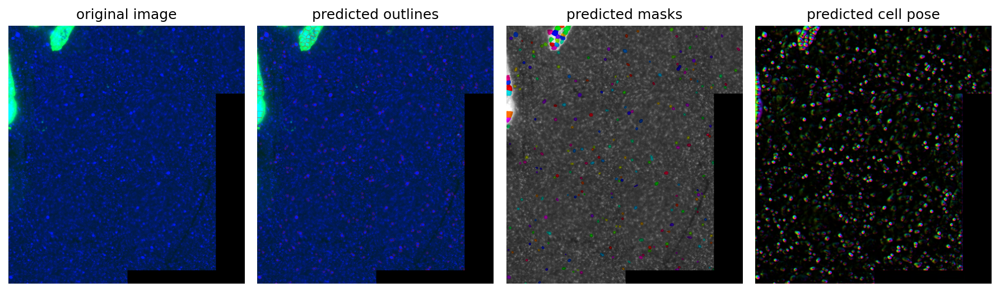

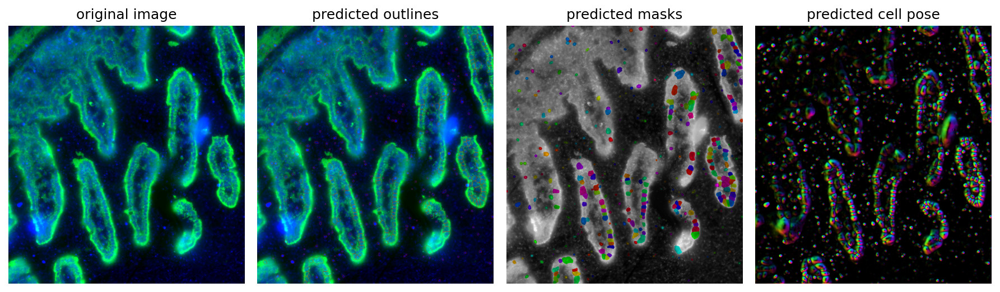

In [9]:
for idx in range(len(imgs)):
    maski = masks[idx]
    flowi = flows[idx][0]
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, imgs[idx][1:3,:,:], maski, flowi, channels=[2,3])
    plt.tight_layout()
    plt.show()

In [10]:
from cellpose import io
io.masks_flows_to_seg(imgs, masks, flows, 30, files, [2,3])

## Improve model

we will look for the manually annoated masks and train a new model

In [9]:
def improve_model(model, n_epochs=100, learning_rate=0.1, weight_decay=0.0001):
    # get files
    output = io.load_train_test_data("training/annotated", None, mask_filter='_seg.npy')
    train_data, train_labels, _, test_data, test_labels, _ = output
    n_annotated = len(train_data)
    print(f"Found {n_annotated} images. Using these to create a new model")
    
    new_model_path = model.train(train_data, train_labels, 
                                  test_data=test_data,
                                  test_labels=test_labels,
                                  channels=[2,3], 
                                  save_path=".", 
                                  n_epochs=n_epochs,
                                  learning_rate=learning_rate, 
                                  weight_decay=weight_decay, 
                                  nimg_per_epoch=8,
                                  model_name=f"Merscope_trained_on_{n_annotated}_images.model")
    return(new_model_path)

In [25]:
model = models.CellposeModel(gpu=use_GPU, model_type='tissuenet')
new_model_path = improve_model(model)

2022-06-14 13:29:11,736 [INFO] >> tissuenet << model set to be used
2022-06-14 13:29:11,743 [INFO] ** TORCH CUDA version installed and working. **
2022-06-14 13:29:11,744 [INFO] >>>> using GPU
2022-06-14 13:29:12,087 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2022-06-14 13:29:12,107 [INFO] not all flows are present, running flow generation for all images
2022-06-14 13:29:13,048 [INFO] 9 / 9 images in training/annotated folder have labels
Found 9 images. Using these to create a new model
2022-06-14 13:29:14,716 [INFO] computing flows for labels


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                         | 5/9 [00:03<00:02,  1.44it/s]

2022-06-14 13:29:18,418 [WARNING] empty masks!


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:05<00:00,  1.77it/s]


2022-06-14 13:29:20,358 [WARNING] 1 train images with number of masks less than min_train_masks (5), removing from train set
2022-06-14 13:29:20,718 [INFO] >>>> median diameter set to = 30
2022-06-14 13:29:20,720 [INFO] >>>> mean of training label mask diameters (saved to model) 26.532
2022-06-14 13:29:20,721 [INFO] >>>> training network with 2 channel input <<<<
2022-06-14 13:29:20,722 [INFO] >>>> LR: 0.10000, batch_size: 8, weight_decay: 0.00010
2022-06-14 13:29:20,723 [INFO] >>>> ntrain = 8
2022-06-14 13:29:20,724 [INFO] >>>> nimg_per_epoch = 8
2022-06-14 13:29:21,189 [INFO] Epoch 0, Time  0.5s, Loss 0.8753, LR 0.0000
2022-06-14 13:29:21,596 [INFO] saving network parameters to ./models/Merscope_trained_on_9_images.model
2022-06-14 13:29:23,530 [INFO] Epoch 5, Time  2.8s, Loss 1.0289, LR 0.0556
2022-06-14 13:29:25,698 [INFO] Epoch 10, Time  5.0s, Loss 0.7992, LR 0.1000
2022-06-14 13:29:29,973 [INFO] Epoch 20, Time  9.2s, Loss 0.6929, LR 0.1000
2022-06-14 13:29:34,230 [INFO] Epoch 30,

### Use the model to annoate the next sample

In [30]:
# declare model
model = models.CellposeModel(gpu=use_GPU, 
                             pretrained_model=new_model_path)

diameter = model.diam_labels
next_img_no = re.search(r"[0-9]+", new_model_path).group(0)
next_img_no = int(next_img_no)

next_img = imgs[next_img_no]

2022-06-14 13:30:45,682 [INFO] >>>> loading model ./models/Merscope_trained_on_9_images.model
2022-06-14 13:30:45,695 [INFO] ** TORCH CUDA version installed and working. **
2022-06-14 13:30:45,697 [INFO] >>>> using GPU
2022-06-14 13:30:46,052 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2022-06-14 13:30:46,054 [INFO] >>>> model diam_labels =  26.532 (mean diameter of training ROIs)


In [31]:
masks, flows, styles = model.eval(next_img, channels=[2,3], diameter=diameter, do_3D=False)

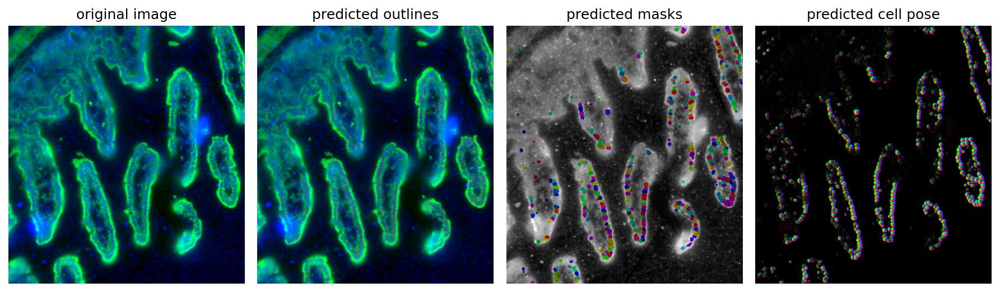

In [32]:
fig = plt.figure(figsize=(12,5))
plot.show_segmentation(fig, next_img[1:3,:,:], masks, flows[0], channels=[2,3])
plt.tight_layout()
plt.show()

In [33]:
io.masks_flows_to_seg(next_img, masks, flows, diameter, f"training/next/img_{next_img_no}.tif", [2,3])

## Train final model

In [34]:
model = models.CellposeModel(gpu=use_GPU, model_type='tissuenet')
new_model_path = improve_model(model, n_epochs=1000)

2022-06-14 13:40:10,647 [INFO] >> tissuenet << model set to be used
2022-06-14 13:40:10,655 [INFO] ** TORCH CUDA version installed and working. **
2022-06-14 13:40:10,656 [INFO] >>>> using GPU
2022-06-14 13:40:10,998 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2022-06-14 13:40:11,015 [INFO] not all flows are present, running flow generation for all images
2022-06-14 13:40:12,054 [INFO] 10 / 10 images in training/annotated folder have labels
Found 10 images. Using these to create a new model
2022-06-14 13:40:13,921 [INFO] computing flows for labels


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 5/10 [00:03<00:03,  1.43it/s]

2022-06-14 13:40:17,648 [WARNING] empty masks!


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.92it/s]


2022-06-14 13:40:19,734 [WARNING] 1 train images with number of masks less than min_train_masks (5), removing from train set
2022-06-14 13:40:20,136 [INFO] >>>> median diameter set to = 30
2022-06-14 13:40:20,137 [INFO] >>>> mean of training label mask diameters (saved to model) 26.578
2022-06-14 13:40:20,139 [INFO] >>>> training network with 2 channel input <<<<
2022-06-14 13:40:20,140 [INFO] >>>> LR: 0.10000, batch_size: 8, weight_decay: 0.00010
2022-06-14 13:40:20,140 [INFO] >>>> ntrain = 9
2022-06-14 13:40:20,141 [INFO] >>>> nimg_per_epoch = 9
2022-06-14 13:40:20,696 [INFO] Epoch 0, Time  0.6s, Loss 1.1711, LR 0.0000
2022-06-14 13:40:21,197 [INFO] saving network parameters to ./models/Merscope_trained_on_10_images.model
2022-06-14 13:40:23,462 [INFO] Epoch 5, Time  3.3s, Loss 0.8996, LR 0.0556
2022-06-14 13:40:26,065 [INFO] Epoch 10, Time  5.9s, Loss 0.7481, LR 0.1000
2022-06-14 13:40:31,151 [INFO] Epoch 20, Time 11.0s, Loss 0.6131, LR 0.1000
2022-06-14 13:40:36,214 [INFO] Epoch 30

In [35]:
new_model_path

'./models/Merscope_trained_on_10_images.model'

In [36]:
model.diam_labels

26.578293809596616